In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os

folder_path = '/content/drive/MyDrive/UCI-HAR'
os.listdir(folder_path)

['y_val.npy',
 'X_val.npy',
 'y_train.npy',
 'y_test.npy',
 'X_train.npy',
 'X_test.npy']

In [ ]:
import numpy as np

X_train = np.load(os.path.join(folder_path, 'X_train.npy'))
y_train = np.load(os.path.join(folder_path, 'y_train.npy'))
X_test = np.load(os.path.join(folder_path, 'X_test.npy'))
y_test = np.load(os.path.join(folder_path, 'y_test.npy'))
X_val = np.load(os.path.join(folder_path, 'X_val.npy'))
y_val = np.load(os.path.join(folder_path, 'y_val.npy'))

In [ ]:
!pip install tsfel

  Using cached jedi-0.19.1-py2.py3-none-any.whl.metadata (22 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.1/61.1 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 39.7 MB/s eta 0:00:00
Using cached jedi-0.19.1-py2.py3-none-any.whl (1.6 MB)


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from sklearn import tree
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import tsfel
import graphviz
import seaborn as sns
%matplotlib inline
# Retina
%config InlineBackend.figure_format = 'retina'

In [ ]:
X_train

array([[[ 0.9736077 , -0.1844755 , -0.2821974 ],
        [ 0.9760866 , -0.1867793 , -0.2848794 ],
        [ 0.977865  , -0.191836  , -0.2891687 ],
        ...,
        [ 0.9779202 , -0.1834941 , -0.2829651 ],
        [ 0.9796224 , -0.1832831 , -0.279844  ],
        [ 0.9775468 , -0.1833646 , -0.2764387 ]],

       [[ 1.00564   , -0.1732591 , -0.2299191 ],
        [ 1.006267  , -0.1727248 , -0.2516695 ],
        [ 1.004331  , -0.1783138 , -0.2447012 ],
        ...,
        [ 0.9963187 , -0.165975  , -0.2166365 ],
        [ 0.998345  , -0.1662256 , -0.2176124 ],
        [ 1.00105   , -0.1642913 , -0.2210956 ]],

       [[ 0.784794  , -0.2597323 , -0.2317497 ],
        [ 0.8028195 , -0.2151319 , -0.2276441 ],
        [ 0.7250539 , -0.2064177 , -0.2095281 ],
        ...,
        [ 0.6540971 , -0.140727  , -0.2860766 ],
        [ 0.6268603 , -0.2748843 , -0.2455943 ],
        [ 0.6052588 , -0.3292142 , -0.1952567 ]],

       ...,

       [[ 1.013856  , -0.08463204, -0.1833906 ],
        [ 1

In [ ]:
X_train_aXYZ = X_train[:, :, 0], X_train[:, :, 1], X_train[:, :, 2]

In [ ]:
X_train_time = np.sum(np.square(X_train), axis = -1)
X_test_time = np.sum(np.square(X_test), axis = -1)
X_val_time = np.sum(np.square(X_val), axis = -1)

In [ ]:
print(X_train_time.shape)
print(X_test_time.shape)
print(X_val_time.shape)

(108, 500)
(36, 500)
(36, 500)


In [ ]:
y_train

array([5, 5, 2, 3, 6, 4, 1, 5, 5, 4, 3, 1, 6, 5, 4, 1, 5, 1, 4, 6, 2, 4,
       6, 3, 6, 1, 1, 6, 6, 2, 5, 1, 4, 2, 6, 4, 3, 3, 6, 4, 2, 3, 6, 3,
       5, 5, 3, 1, 3, 1, 4, 6, 4, 5, 4, 4, 3, 4, 2, 4, 2, 1, 2, 5, 4, 2,
       5, 2, 3, 6, 1, 3, 2, 2, 1, 3, 6, 2, 5, 1, 3, 2, 4, 5, 4, 2, 1, 1,
       1, 3, 5, 5, 6, 1, 4, 6, 6, 5, 3, 3, 2, 6, 6, 3, 1, 5, 2, 2],
      dtype=int32)

In [ ]:
df = pd.DataFrame(X_train_time)
df.head()

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,1.061579,1.068788,1.076640,1.081619,1.083677,1.089191,1.088519,1.077718,1.072226,1.073787,...,1.065313,1.069200,1.072072,1.072758,1.069753,1.067005,1.067372,1.070067,1.071565,1.065639
1,1.094193,1.105745,1.100355,1.088352,1.073085,1.064589,1.070972,1.072502,1.076323,1.085273,...,1.071004,1.072441,1.074535,1.066675,1.063528,1.065388,1.066096,1.067130,1.071679,1.077976
2,0.737070,0.742623,0.612213,0.611427,0.618866,0.576885,0.663982,0.715187,0.761910,0.818487,...,0.715990,0.735479,0.709034,0.721843,0.720080,0.607252,0.565186,0.529487,0.528832,0.512845
3,2.330978,2.364194,2.285008,1.995089,1.486505,0.885626,0.609474,0.559679,0.520461,0.465431,...,0.496868,0.526072,0.593439,0.797267,1.059548,1.047754,1.088295,1.385482,1.619239,1.388138
4,1.045221,1.049030,1.053342,1.063177,1.059419,1.052925,1.058818,1.050844,1.043341,1.047368,...,1.053456,1.042352,1.038869,1.047991,1.053762,1.052498,1.050367,1.048974,1.050502,1.046420


In [ ]:
df["Label"] = y_train
df.sort_values(by = "Label", inplace = True)
sorted_index = np.array(df.index)
sorted_index

array([ 86,  26,  25,  87,  93,  47,  49,  17,  15,  31,  61,  88,  70,
        74,  79,   6,  11, 104,  33,  73,  72,  40,  62, 106,  58,  67,
        65,  81,  85,  60, 107,  77,   2, 100,  29,  20,  75,   3,  71,
       103,  68,  80,  10,  99,  98,  56,  48,  89,  41,  36,  37,  43,
        23,  46,  32,  35,   5,  39,   9,  64,  21,  54,  59,  57,  55,
        84,  18,  52,  82,  50,  94,  14,  97,  78,  91,  90, 105,  83,
         0,  53,  66,  63,   1,  45,  44,   7,  30,   8,  13,  16,   4,
       102, 101,  12,  96,  69,  19,  76,  92,  24,  27,  28,  34,  38,
        42,  51,  95,  22])

In [ ]:
X_train_aXYZ = X_train_aXYZ[0][sorted_index], X_train_aXYZ[1][sorted_index], X_train_aXYZ[2][sorted_index]

In [ ]:
X_train_df = pd.DataFrame(X_train_time)
X_train_df["Label"] = y_train
X_train_df.sort_values(by = "Label", inplace = True)
X_train_df.set_index(pd.Series(range(108)), inplace = True)
X_train_df

,0,1,2,3,4,5,6,7,8,9,...,491,492,493,494,495,496,497,498,499,Label
0,0.714053,0.732246,0.768960,0.853281,0.950569,1.001927,1.025067,1.039051,1.033828,1.021974,...,1.477209,1.245564,0.884933,0.751383,0.895341,1.111554,1.159284,1.061964,0.962311,1
1,0.751970,0.651734,0.579656,0.587043,0.606218,0.727218,0.797291,0.794672,0.834353,0.888909,...,0.396283,0.573048,0.702095,0.827120,0.867516,0.805562,0.813949,0.771488,0.791860,1
2,0.596975,0.577279,0.564058,0.773096,0.871679,1.057734,1.427447,1.728494,1.920396,1.673412,...,0.961942,1.053653,1.100745,1.275938,1.522039,1.531372,1.548665,1.541446,1.412323,1
3,1.447083,1.243813,0.999385,0.811583,0.683452,0.727751,0.759291,0.818850,0.947241,0.960450,...,1.395899,1.404201,1.532946,2.060462,2.916117,3.367976,2.650901,1.300202,0.516547,1
4,0.678714,0.700478,1.148305,2.166170,2.921367,2.662965,1.954290,1.440979,1.186594,1.258637,...,1.112212,1.326475,1.516445,1.761912,2.096122,1.985628,1.334452,0.939196,0.868019,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103,0.996194,0.991963,0.984747,0.987995,0.992127,0.994089,0.995440,0.998901,1.003637,1.002344,...,1.010409,1.008286,1.004564,1.001250,0.997999,0.996779,0.991216,0.983254,0.985567,6
104,1.030783,1.005243,0.994559,0.997765,1.005931,1.004629,0.970352,0.929467,0.959656,1.012440,...,0.978252,1.000408,1.027792,1.028454,1.006944,0.987428,0.983824,0.990666,0.990392,6
105,1.017841,1.016995,1.024412,1.029757,1.026955,1.028478,1.026419,1.026562,1.034466,1.037380,...,1.035634,1.040731,1.038952,1.027263,1.011913,1.013323,1.020733,1.019209,1.022797,6
106,1.003037,1.000143,1.002048,0.993890,0.997013,1.012518,1.025586,1.026735,1.021032,1.016388,...,1.010742,1.016365,1.022836,1.018828,1.014693,1.025160,1.033535,1.029625,1.023284,6


In [ ]:
X_train_df["Label"].value_counts()

,count
Label,
1,18
2,18
3,18
4,18
5,18
6,18


In [ ]:
classes = {
    1:'WALKING',
    2:'WALKING_UPSTAIRS',
    3:'WALKING_DOWNSTAIRS',
    4:'SITTING',
    5:'STANDING',
    6:'LAYING'
}

In [ ]:
classes

{1: 'WALKING',
 2: 'WALKING_UPSTAIRS',
 3: 'WALKING_DOWNSTAIRS',
 4: 'SITTING',
 5: 'STANDING',
 6: 'LAYING'}

Length of time series: 500


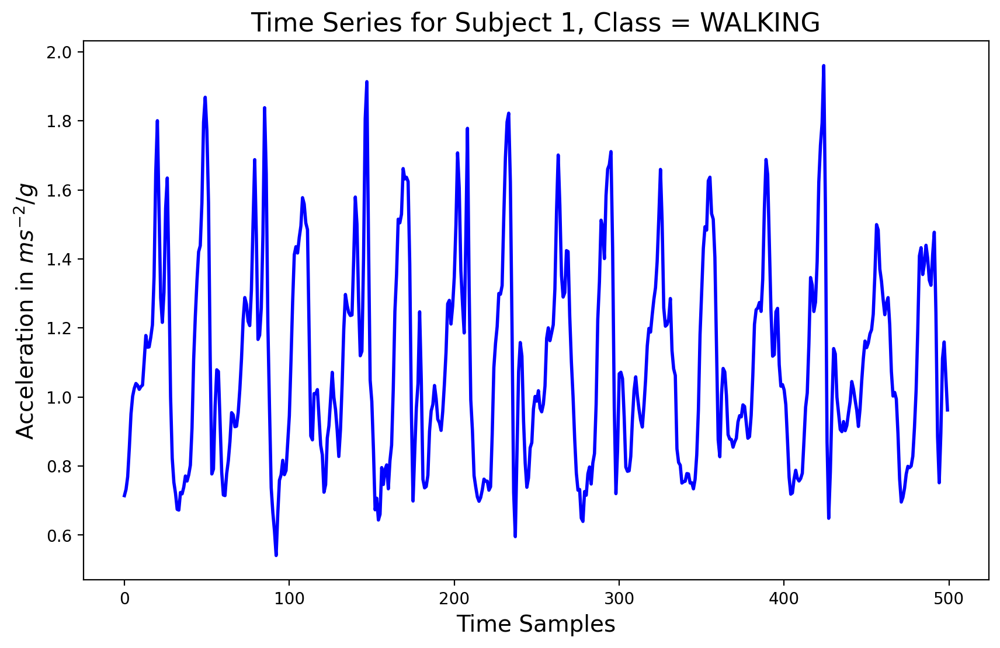

In [ ]:
k = 0
c = 0
sorted_Y_train = np.array(X_train_df["Label"])

time_series = X_train_df.iloc[c, :-1]

print("Length of time series:", len(time_series))

plt.figure(figsize=(10, 6))
plt.plot(time_series, color='blue', linewidth=2)
plt.title(f"Time Series for Subject {c + 1}, Class = {classes[sorted_Y_train[c]]}", fontsize=16)
plt.ylabel(r"Acceleration in $ms^{-2}/g$", fontsize=14)
plt.xlabel("Time Samples", fontsize=14)

plt.show()

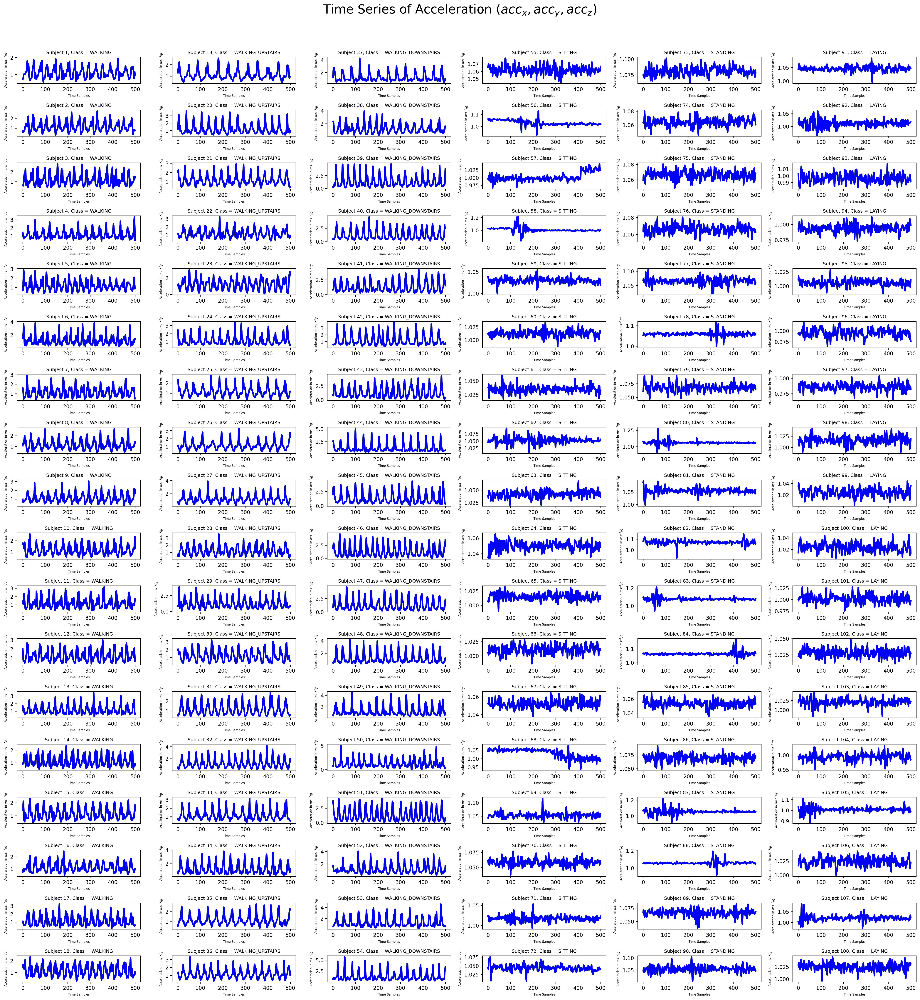

In [ ]:
sorted_Y_train = np.array(X_train_df["Label"])

fig, axes = plt.subplots(18, 6, figsize=(25, 27.5))
fig.suptitle(r"Time Series of Acceleration $(acc_x, acc_y, acc_z)$", size=24)

colors = ["red", "green", "blue"]

c = 0

for i in range(6):
    for j in range(18):
        for k in range(3):
            time_series = X_train_df.iloc[c, :-1]

            axes[j, i].plot(time_series, color=colors[k], linewidth=3)

        axes[j, i].set_title(f"Subject {c + 1}, Class = {classes[sorted_Y_train[c]]}", fontsize=9)
        axes[j, i].set_ylabel(r"Acceleration in $ms^{-2}/g$", fontsize=6)
        axes[j, i].set_xlabel("Time Samples", fontsize=6)

        c += 1

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

1. The plots clearly distinguish between static activities (such as Laying, Sitting, Standing) and dynamic activities (like Walking, Walking Downstairs, Walking Upstairs). Dynamic activities exhibit more volatility and higher variance compared to static activities.

2. Time series data for subjects within the same activity class show notable similarities in trends, indicating a degree of consistency in how these activities manifest in the data.

3. The model appears likely to differentiate between static and dynamic activities effectively. However, accurately classifying activities within these broader categories may depend on various factors, including the choice of model, hyperparameters, and the features extracted from the data.

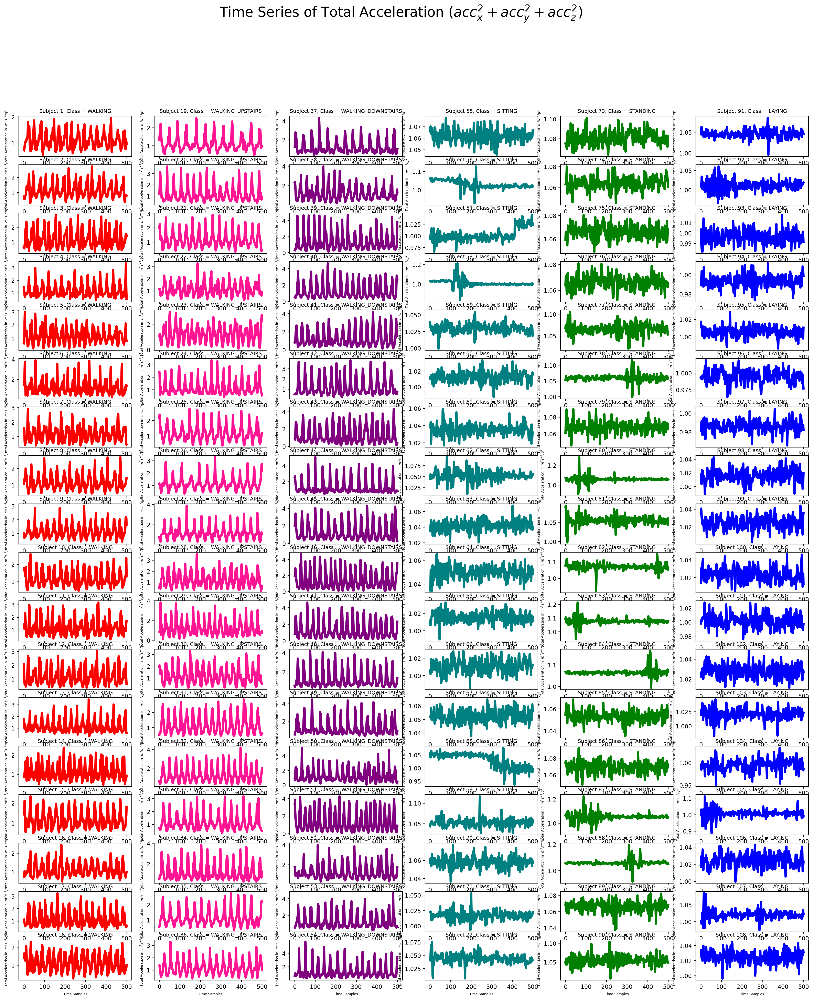

In [ ]:
fig, axes = plt.subplots(18, 6, figsize=(25, 27.5))
fig.suptitle(r"Time Series of Total Acceleration $(acc_x^2 + acc_y^2 + acc_z^2)$", size=24)

sorted_Y_train = np.array(X_train_df["Label"])
colors = ["red", "deeppink", "purple", "teal", "green", "blue"]
c = 0

for i in range(6):
    for j in range(18):
        time_series = X_train_df.iloc[c, :-1]
        axes[j, i].plot(time_series, color=colors[i], linewidth=4)
        axes[j, i].set_title(f"Subject {c + 1}, Class = {classes[sorted_Y_train[c]]}", fontsize=9)
        axes[j, i].set_ylabel(r"Total Acceleration in  $m^{2}s^{-4}/g^2$", fontsize=6)
        axes[j, i].set_xlabel("Time Samples", fontsize=6)
        c += 1

1. Differentiating between static and dynamic activities may not always require a machine learning model, but implementing one could be a helpful approach.

2. Time series features can be extracted from activity samples to derive meaningful insights.

3. An automated approach would involve using a machine learning model to learn the data distribution.

4. A straightforward machine learning model, such as a Decision Tree Classifier, could effectively classify static and dynamic activities, given that dynamic activities typically exhibit more volatility and variance compared to static ones.

### Train Decision Tree using trainset and report Accuracy and confusion matrix using testset.

In [ ]:
model = DecisionTreeClassifier(random_state=42)
dt_trained = model.fit(X_train_time, y_train)
y_pred = dt_trained.predict(X_test_time)
y_pred

array([6, 1, 6, 1, 6, 5, 6, 1, 1, 1, 4, 6, 6, 5, 2, 6, 5, 5, 3, 6, 4, 1,
       4, 5, 2, 1, 3, 6, 1, 4, 6, 6, 6, 1, 1, 3], dtype=int32)

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       0.40      0.67      0.50         6
           2       0.50      0.17      0.25         6
           3       0.33      0.17      0.22         6
           4       0.50      0.33      0.40         6
           5       1.00      0.83      0.91         6
           6       0.50      1.00      0.67         6

    accuracy                           0.53        36
   macro avg       0.54      0.53      0.49        36
weighted avg       0.54      0.53      0.49        36



In [ ]:
conf_matrix = confusion_matrix(y_test, y_pred)
conf_matrix_df = pd.DataFrame(conf_matrix, index = [class_cm for class_cm in classes], columns = [class_cm for class_cm in classes])

In [ ]:
## flag = 1 for a single plot and 0 for subplots for 2 - 8 depths
def confusion_matrix_plot(dataFrame, flag=1, accuracies=None):
    if flag:
        plt.figure(figsize=(5, 5))
        ax = sns.heatmap(dataFrame, annot=True, cmap="PuBu", cbar_kws={"shrink": 0.75})
        plt.setp(ax.get_xticklabels(), fontsize=10)
        plt.setp(ax.get_yticklabels(), fontsize=10)
        plt.ylabel("True label", fontsize=16)
        plt.xlabel("Predicted label", fontsize=16)
        plt.title(f"Accuracy = {accuracy_score(y_test, y_pred) * 100: .4f}%", fontweight="bold", fontsize=14)
        plt.savefig("Single_ConfusionM.png")
        plt.show()
    else:
        fig, axes = plt.subplots(3, 3, figsize=(18, 18))
        axes = axes.flatten()

        for i, df in enumerate(dataFrame):
            ax = sns.heatmap(df, annot=True, ax=axes[i], cbar=False, cmap="PuBu", annot_kws={"size": 10})
            plt.setp(ax.get_xticklabels(), fontsize=8)
            plt.setp(ax.get_yticklabels(), fontsize=8)
            ax.set_title(f"Depth = {i + 2}\nAccuracy = {accuracies[i] * 100: .4f}%", fontsize=12)
            ax.set_ylabel("True label", fontsize=10)
            ax.set_xlabel("Predicted label", fontsize=10)

        for j in range(i + 1, len(axes)):
            fig.delaxes(axes[j])

        # Shared colorbar
        fig.subplots_adjust(right=0.85)
        cbar_ax = fig.add_axes([0.87, 0.15, 0.03, 0.7])
        sns.heatmap(df, annot=False, ax=axes[0], cbar_ax=cbar_ax, cmap="PuBu")

        plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust layout to make space for colorbar
        plt.savefig("DepthConfusionM.png")
        plt.show()


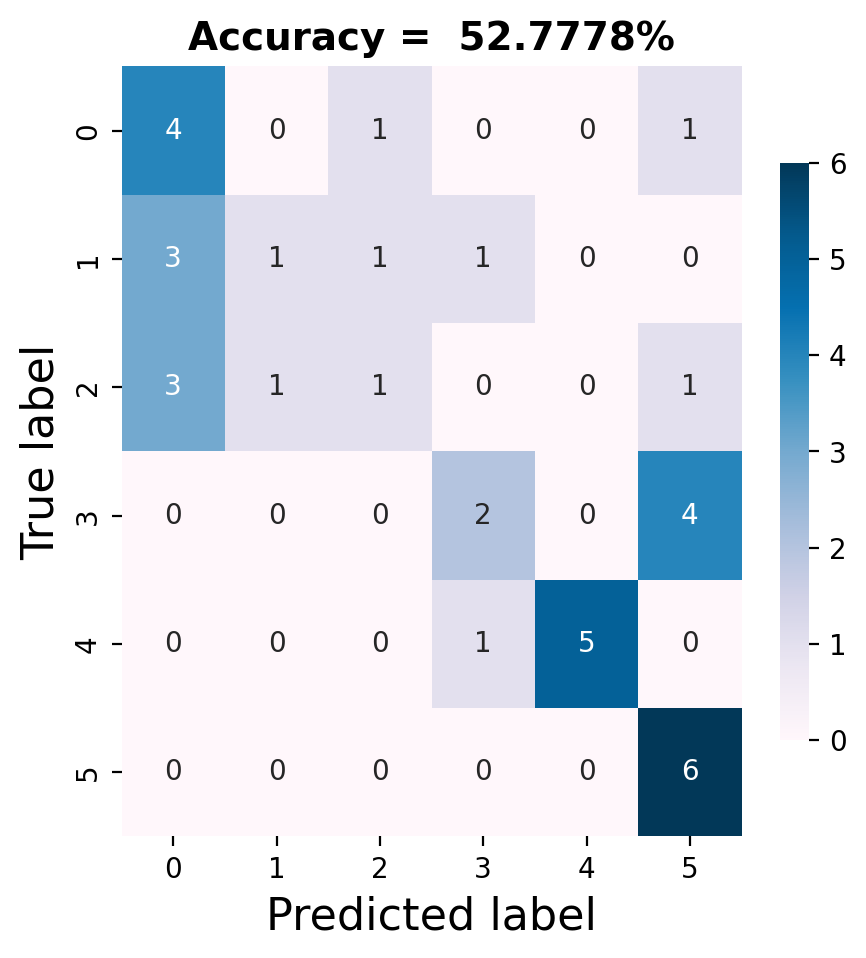

In [ ]:
confusion_matrix_plot(conf_matrix, 1)

1. The overall performance of the Decision Tree Classifier model trained on the raw total acceleration dataset was, on average, only slightly better than random chance.

2. The model performed reasonably well in distinguishing between Static and Dynamic Activities.

3. **Classification among the Static Activities:**
The model was most accurate in identifying the STANDING activity but often misclassified LAYING as SITTING. In contrast, classifications within the Dynamic Activities exhibited significant confusion.

#### Train Decision Tree with varying depths (2-8) using trainset and report accuracy and confusion matrix using Test set. Does the accuracy change when the depth is increased? Plot the accuracies and reason why such a result has been obtained.

In [ ]:
conf_matrices, class_reports, class_reports_dictionary, accuracies = [], [], [], []
for i in range(2, 9):
    model = DecisionTreeClassifier(max_depth = i,random_state=42)
    clfg = model.fit(X_train_time, y_train)
    y_pred = clfg.predict(X_test_time)
    pred, actual = y_pred, y_test

    cm = confusion_matrix(actual, pred)

    conf_matrices.append(pd.DataFrame(cm, index = [class_cm for class_cm in classes], columns = [class_cm for class_cm in classes]))
    class_reports.append(classification_report(actual, pred, labels = np.unique(pred)))
    class_reports_dictionary.append(classification_report(actual, pred, labels = np.unique(pred), output_dict = True))
    accuracies.append(accuracy_score(actual, pred))

<ipython-input-43-1a5b3ac4e9e9>:33: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust layout to make space for colorbar


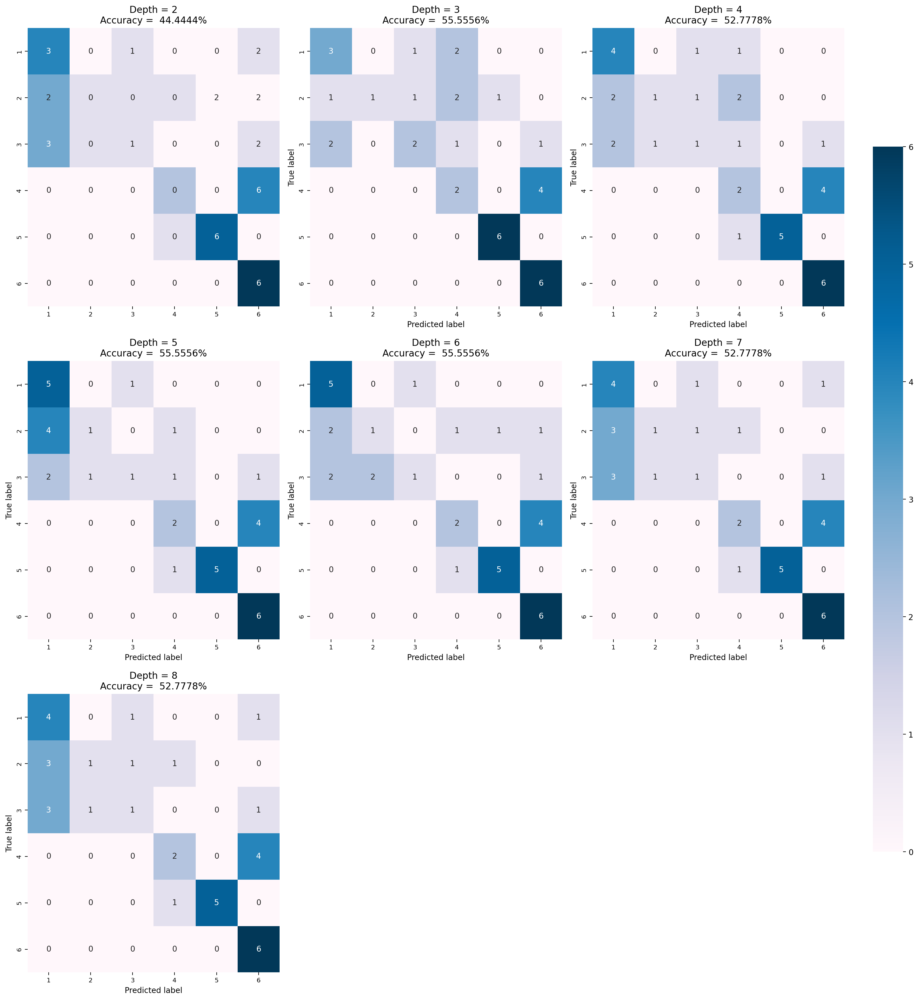

In [ ]:
confusion_matrix_plot(conf_matrices, 0, accuracies = accuracies)

Classification Reports

In [ ]:
accuracies

[0.4444444444444444,
 0.5555555555555556,
 0.5277777777777778,
 0.5555555555555556,
 0.5555555555555556,
 0.5277777777777778,
 0.5277777777777778]

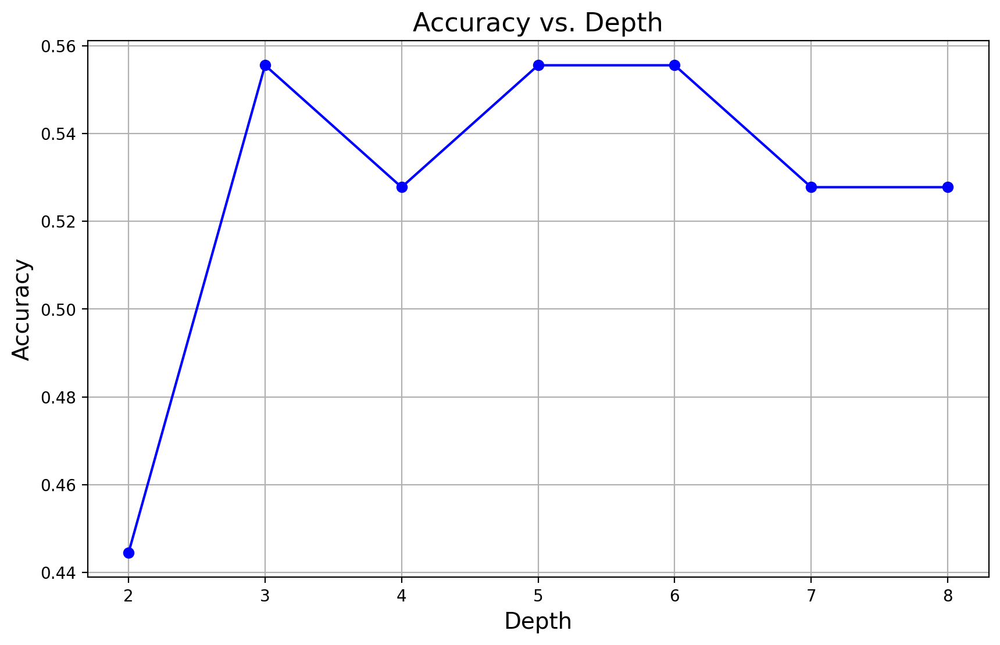

In [ ]:
depths = list(range(2, 9))

plt.figure(figsize=(10, 6))
plt.plot(depths, accuracies, marker='o', linestyle='-', color='b')

plt.title('Accuracy vs. Depth', fontsize=16)
plt.xlabel('Depth', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.xticks(depths)
plt.grid(True)

plt.savefig("Accuracy_vs_Depth.png")
plt.show()

1. **At Depth 2**: The model appears to be underfitting, as evidenced by its high rate of misclassifying Dynamic Activities as Static ones. Additionally, it only classifies a limited number of activities and fails to predict the activities "WALKING UPSTAIRS" and "SITTING" at all.

2. **Accuracy Peaks at Depth 5 and 6**: The model's accuracy reaches its highest values at depths 5 and 6, which aligns with the expected trend of increased accuracy at higher depths.

3. **Note**: These observations are specific to the selected model and may not apply universally. Moreover, the small size of the training and testing samples limits the reliability of activity distribution insights.